# Решето Эратосфена

Алгоритм нахождения всех простых чисел до заданного числа \( n \).

## Алгоритм
1. Записать все числа от 2 до \( n \).
2. Начать с первого числа (2) — оно простое.
3. Вычеркнуть все кратные ему числа (начиная с \( p^2 \)).
4. Перейти к следующему невычеркнутому числу и повторить.
5. Остановиться, когда ( p > \sqrt{n} \).
6. Все оставшиеся числа — простые.

## Сложность
- **Время**: \( O(n \log \log n) \)
- **Память**: \( O(n) \)

In [11]:
import math
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import threading
import time
import sys


plt.rcParams['animation.embed_limit'] = 50 

def make_sieve_actions_batched_optimized(n):
    """Создает список действий для анимации решета Эратосфена."""
    if n < 2:
        return [], [0] * (n + 1)
    
    is_prime = [True] * (n + 1)
    is_prime[0:2] = [False, False]
    actions = []
    limit = int(n**0.5) + 1

    for p in range(2, limit):
        if is_prime[p]:
            actions.append(("mark_current", p))
            multiples = []
            for m in range(p * p, n + 1, p):
                if is_prime[m]:
                    is_prime[m] = False
                    multiples.append(m)
            if multiples:
                actions.append(("cross_many", multiples))
            actions.append(("mark_prime", p))

    for q in range(limit, n + 1):
        if is_prime[q]:
            actions.append(("mark_prime", q))

    final_state = [0] * (n + 1)
    for i in range(2, n + 1):
        final_state[i] = 1 if is_prime[i] else 2

    return actions, final_state

def format_message(action_type, value):
    """Форматирует сообщение для каждого шага анимации."""
    if action_type == "mark_current":
        return f"Текущее простое: {value}. Вычёркиваем кратные."
    elif action_type == "cross_many":
        shown = value[:5]
        suffix = "..." if len(value) > 5 else ""
        multiples_str = ", ".join(map(str, shown)) + suffix
        return f"Вычёркиваем: {multiples_str}"
    elif action_type == "mark_prime":
        return f"{value} — простое."
    else:
        return ""

def animate_sieve_batched(n=256, interval=200):
    """Создает и возвращает HTML-анимацию решета Эратосфена."""
    if not isinstance(n, int) or n < 1:
        raise ValueError("n должно быть целым числом ≥ 1")

    cols = max(1, int(n**0.5)) 
    rows = (n + cols - 1) // cols
    fig_w = cols * 0.45 + 1.5
    fig_h = rows * 0.45 + 2.0
    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    ax.set_xlim(0, cols)
    ax.set_ylim(-0.8, rows) 
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"Решето Эратосфена: числа до {n}", fontsize=14, pad=10)

    info_text = ax.text(
        cols / 2, -0.6, "", ha="center", va="top",
        fontsize=10, color="black", fontweight="bold",
        bbox=dict(
            facecolor='lightyellow', 
            edgecolor='black',     
            boxstyle='round,pad=0.3' 
        ),
        wrap=True 
    )

    color_unknown = "#e6e6e6"
    color_prime = "#7bbf6a"
    color_current = "#ffb048"
    color_composite = "#ffffff"

    rects, texts, crosses = {}, {}, {}
    for num in range(1, n + 1):
        idx = num - 1
        c = idx % cols
        r = rows - 1 - (idx // cols)
        rect = Rectangle((c, r), 1, 1, edgecolor="black", facecolor=color_unknown, lw=0.5)
        ax.add_patch(rect)
        rects[num] = rect
        txt = ax.text(c + 0.5, r + 0.55, str(num), ha="center", va="center", fontsize=7)
        texts[num] = txt
        cr = ax.text(c + 0.78, r + 0.22, "", ha="center", va="center", fontsize=10, weight="bold", color="red")
        crosses[num] = cr

    actions, _ = make_sieve_actions_batched_optimized(n)
    current = [None]

    def update(frame_index):
        typ, val = actions[frame_index]
        message = format_message(typ, val)

        if typ == "mark_current":
            if current[0] is not None:
                rects[current[0]].set_facecolor(color_prime)
            current[0] = val
            rects[val].set_facecolor(color_current)
        elif typ == "cross_many":
            for m in val:
                rects[m].set_facecolor(color_composite)
                texts[m].set_color("gray")
                crosses[m].set_text("×")
        elif typ == "mark_prime":
            rects[val].set_facecolor(color_prime)
            texts[val].set_color("black")
            crosses[val].set_text("")
            if current[0] == val:
                current[0] = None

        info_text.set_text(message)
        return []

    anim = FuncAnimation(fig, update, frames=len(actions), interval=interval, repeat=False, blit=False)
    plt.close(fig)
    return HTML(anim.to_jshtml())

def show_loading_animation(func, *args, **kwargs):
    """
    Запускает функцию в отдельном потоке и показывает анимацию загрузки в консоли.
    """
    result_container = {}

    def worker():
        """Функция-работник, которая выполняет основную задачу."""
        result_container['result'] = func(*args, **kwargs)
    thread = threading.Thread(target=worker)
    thread.start()
    spinner_chars = ['|', '/', '-', '\\']
    idx = 0
    while thread.is_alive():
        char = spinner_chars[idx % len(spinner_chars)]
        # flush=True гарантирует немедленный вывод
        sys.stdout.write(f'\rГенерация анимации... {char}')
        sys.stdout.flush()
        time.sleep(0.1)
        idx += 1
    sys.stdout.write('\rГенерация анимации... Готово!      \n')
    sys.stdout.flush()
    
    return result_container['result']

try:
    n = int(input("Введите верхнюю границу отрезка (целое число ≥ 1): "))
    if n < 1:
        print("Ошибка: n должно быть ≥ 1")
    else:
        animation_html = show_loading_animation(animate_sieve_batched, n=n, interval=300)
        try:
            from IPython.display import display
            display(animation_html)
        except ImportError:
            print("\nHTML-код анимации сгенерирован и сохранен в переменной 'animation_html'.")
            print("Для просмотра откройте его в браузере.")
            
except ValueError:
    print("Ошибка: введите целое число!")

Введите верхнюю границу отрезка (целое число ≥ 1):  400


Генерация анимации... Готово!      


# Алгоритм факторизации Ферма

Метод разложения нечётного целого числа $ n $ на два множителя, основанный на представлении числа в виде **разности квадратов**:

$$
n = a^2 - b^2 = (a - b)(a + b)
$$

## Алгоритм

1. Начать с $ a = \lceil \sqrt{n} \rceil $.
2. Вычислить $ b^2 = a^2 - n $.
3. Проверить, является ли $ b^2 $ полным квадратом:
   - Если да → найдены множители: $ (a - b) $ и $ (a + b) $.
   - Если нет → увеличить $ a $ на 1 и повторить.
4. Продолжать, пока $ a \leq \frac{n+1}{2} $.

## Когда эффективен

- Особенно хорошо работает, если у $ n $ есть два множителя, **близкие друг к другу**.
- Неэффективен для чисел с малыми простыми делителями (лучше использовать перебор или решето).

## Сложность

- В худшем случае: $ O(n) $
- В лучшем (при близких множителях): $ O(\sqrt[4]{n}) $

In [1]:
import math
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import random
import sys
from collections import Counter

in_jupyter = 'ipykernel' in sys.modules

if in_jupyter:
    from IPython.display import display, HTML
    %matplotlib inline

plt.rcParams['text.usetex'] = False
plt.rcParams['font.family'] = 'DejaVu Sans'

def is_prime_fermat(n, k=15):
    """Проверяет, является ли число простым с помощью теста Ферма."""
    if n <= 1:
        return False
    if n <= 3:
        return True
    if n % 2 == 0:
        return False
    for _ in range(k):
        a = random.randint(2, n - 2)
        if pow(a, n - 1, n) != 1:
            return False
    return True

def find_fermat_factors(num):
    """
    Вспомогательная функция: находит один любой делитель для num методом Ферма.
    Возвращает (f1, f2).
    """
    if num % 2 == 0:
        return (2, num // 2)
        
    x = math.isqrt(num)
    if x * x < num:
        x += 1
    
    while True:
        y2 = x * x - num
        y = math.isqrt(y2)
        if y * y == y2:
            return (x - y, x + y)
        x += 1

def generate_all_steps(n):
    """
    Генерирует все шаги разложения числа n на множители.
    (Версия с полностью исправленной и упрощенной логикой)
    """
    steps = []
    step_num = 0
    original_n = n
    if is_prime_fermat(n):
        steps.append({
            "title": "Результат",
            "text": [f"Число {n} является **простым**."]
        })
        return steps

    power_of_2 = 0
    while n % 2 == 0:
        power_of_2 += 1
        n //= 2

    if power_of_2 > 0:
        steps.append({
            "title": f"Шаг {step_num}: Выделение множителей 2",
            "text": [
                f"Число {original_n} чётное. Делим на 2, пока возможно:",
                f"{original_n} = 2^{power_of_2} · {n}"
            ]
        })
        step_num += 1

    if n == 1:
        canonical = f"2^{power_of_2}"
        steps.append({
            "title": f"Итоговое разложение числа {original_n}",
            "text": [f"{original_n} = {canonical}"]
        })
        return steps
    queue = [n]
    prime_factors = []

    while queue:
        num_to_factor = queue.pop(0)

        if is_prime_fermat(num_to_factor):
            prime_factors.append(num_to_factor)
            continue
        f1, f2 = find_fermat_factors(num_to_factor)
        
        steps.append({
            "title": f"Шаг {step_num}: Разложение {num_to_factor}",
            "text": [
                f"Находим делители для {num_to_factor}:",
                f"{num_to_factor} = {f1} · {f2}"
            ]
        })
        step_num += 1
        queue.append(f1)
        queue.append(f2)

    all_factors = [2] * power_of_2 + prime_factors
    factor_count = Counter(all_factors)
    
    canonical = " · ".join(
        f"{p}^{e}" if e > 1 else str(p)
        for p, e in sorted(factor_count.items())
    )
    full_str = " · ".join(map(str, sorted(all_factors)))

    steps.append({
        "title": f"✅ Итоговое разложение числа {original_n}",
        "text": [f"{original_n} = {full_str} = {canonical}"]
    })

    return steps

def create_and_display_animation(n):
    """Создает и отображает анимацию для одного числа в Jupyter."""
    steps = generate_all_steps(n)
    
    max_lines = max(len(step["text"]) for step in steps) + 2
    fig_height = max(3.5, max_lines * 0.25)
    
    fig, ax = plt.subplots(figsize=(8, fig_height))
    ax.axis('off')
    
    def update(frame):
        ax.clear()
        ax.axis('off')
        ax.set_title(f"Анализ числа {n} методом Ферма", fontsize=14, fontweight='bold', pad=10)
        
        step = steps[frame]
        y_pos = 0.95
        line_height = 0.08
        
        ax.text(0.05, y_pos, step["title"], transform=ax.transAxes, fontsize=12, fontweight='bold', va='top')
        y_pos -= line_height * 1.2
        
        for line in step["text"]:
            ax.text(0.05, y_pos, line, transform=ax.transAxes, fontsize=11, va='top')
            y_pos -= line_height
            
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

    anim = FuncAnimation(fig, update, frames=len(steps), interval=2500, repeat=True)
    
    if in_jupyter:
        display(HTML(anim.to_jshtml()))
        plt.close(fig)
    else:
        print("Для запуска вне Jupyter требуется сохранение в GIF.")
        plt.close(fig)

if __name__ == "__main__":
    while True:
        try:
            count_input = input("Введите количество случайных чисел для генерации: ").strip()
            count = int(count_input)
            if 1 <= count:
                break
            else:
                print("❌ Пожалуйста, введите число от 1.")
        except ValueError:
            print("❌ Некорректный ввод. Введите целое число.")
    while True:
        try:
            inp = input("Введите границу верхнего диапозона: ").strip()
            high_limit = int(inp)
            if 2 <= high_limit:
                break
            else:
                print("❌ Пожалуйста, введите число от 2.")
        except ValueError:
            print("❌ Некорректный ввод. Введите целое число.")
    numbers = [random.randint(0,high_limit + 1) for _ in range(count)]
    
    print(f"\nСгенерированные числа для анализа: {numbers}\n")
    print("--- Начинаем разложение ---\n")

    for i, num in enumerate(numbers):
        print(f"Анимация для числа {num} ({i+1}/{count}):")
        create_and_display_animation(num)
        print("-" * 20)

Введите количество случайных чисел для генерации:  5
Введите границу верхнего диапозона:  99999



Сгенерированные числа для анализа: [67177, 47014, 32963, 37548, 93743]

--- Начинаем разложение ---

Анимация для числа 67177 (1/5):


C:\Users\User\AppData\Local\Temp\ipykernel_6260\2851907314.py:157: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  display(HTML(anim.to_jshtml()))


--------------------
Анимация для числа 47014 (2/5):


C:\Users\User\AppData\Local\Temp\ipykernel_6260\2851907314.py:157: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  display(HTML(anim.to_jshtml()))


--------------------
Анимация для числа 32963 (3/5):


C:\Users\User\AppData\Local\Temp\ipykernel_6260\2851907314.py:157: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  display(HTML(anim.to_jshtml()))


--------------------
Анимация для числа 37548 (4/5):


C:\Users\User\AppData\Local\Temp\ipykernel_6260\2851907314.py:157: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  display(HTML(anim.to_jshtml()))


--------------------
Анимация для числа 93743 (5/5):


C:\Users\User\AppData\Local\Temp\ipykernel_6260\2851907314.py:157: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  display(HTML(anim.to_jshtml()))


--------------------


# Методы проверки простоты числа



## 1. Тест Соловея – Штрассена

Вероятностный тест простоты, основанный на **символе Якоби** и **обобщении малой теоремы Ферма**.

### Основная идея

Для нечётного целого числа $ n > 2 $ и случайного основания $ a \in [2, n-1] $, взаимно простого с $ n $, проверяется сравнение:

 $$ a^{(n-1)/2} \equiv \left( \frac{a}{n} \right) \pmod{n}
 $$ 
где $ \left( \frac{a}{n} \right) $ — символ Якоби.

Если сравнение нарушено, то $ n $ — составное. Если выполнено — $ n $ **вероятно** простое.

### Алгоритм

1.  Убедиться, что $ n $ нечётно и $ n > 2 $.
2.  Выбрать случайное $ a \in [2, n-1] $.
3.  Вычислить $ x = a^{(n-1)/2} \bmod n $.
4.  Вычислить символ Якоби $ j = \left( \frac{a}{n} \right) $.
5.  Если $ x \not\equiv j \pmod{n} $ или $ x = 0 $, то $ n $ составное.
6.  Повторить $ k $ раз для повышения надёжности.

### Свойства

-   **Ошибка**: вероятность ошибки ≤ $ 1/2 $ на одну итерацию.
-   После $ k $ итераций: вероятность ошибки ≤ $ 1/2^k $.
-   **Сложность**: $ O(k \cdot \log^3 n) $.

---

## 2. Тест Лемана

Простейший вероятностный тест простоты, предшественник более известных методов. Редко используется на практике, но имеет теоретическое значение.

### Основная идея

Если $ n $ — нечётное составное число, то существует $ a \in [1, n-1] $, для которого:

 $$ a^{(n-1)/2} \not\equiv \pm 1 \pmod{n}
 $$ 
Если для всех $ a $ выполняется $ a^{(n-1)/2} \equiv \pm 1 \pmod{n} $, то $ n $ **возможно** простое.

### Алгоритм

1.  Убедиться, что $ n $ нечётно и $ n > 2 $.
2.  Выбрать случайное $ a \in [2, n-2] $.
3.  Вычислить $ x = a^{(n-1)/2} \bmod n $.
4.  Если $ x \not\equiv 1 $ и $ x \not\equiv n-1 $, то $ n $ составное.
5.  Повторить $ k $ раз.

### Свойства

-   **Ошибка**: вероятность ошибки ≤ $ 1/2 $ на итерацию.
-   Проще в реализации, но слабее по надёжности, чем тесты Соловея–Штрассена или Миллера–Рабина.
-   **Сложность**: $ O(k \cdot \log^3 n) $.

---

## 3. Тест Миллера – Рабина

Наиболее популярный **вероятностный** тест простоты. Широко применяется в криптографии для генерации больших простых чисел.

### Основная идея

Основан на разложении $ n - 1 = 2^s \cdot d $, где $ d $ — нечётно. Для простого $ n $ и любого $ a \in [2, n-2] $ выполняется хотя бы одно из условий:

-   $ a^d \equiv 1 \pmod{n} $, или
-   $ a^{2^r d} \equiv -1 \pmod{n} $ для некоторого $ 0 \le r < s $.

Если ни одно не выполнено — $ n $ составное.

### Алгоритм

1.  Представить $ n - 1 = 2^s \cdot d $ с нечётным $ d $.
2.  Повторить $ k $ раз:
    -   Выбрать случайное $ a \in [2, n-2] $.
    -   Вычислить $ x = a^d \bmod n $.
    -   Если $ x = 1 $ или $ x = n-1 $, перейти к следующей итерации.
    -   Повторить $ s-1 $ раз:
        -   $ x = x^2 \bmod n $         -   Если $ x = n-1 $, выйти из внутреннего цикла.
    -   Если внутренний цикл завершился без $ x = n-1 $ → $ n $ составное.
3.  Если все итерации пройдены → $ n $ **вероятно** простое.

### Свойства

-   **Ошибка**: ≤ $ 1/4 $ на итерацию.
-   После $ k $ итераций: ошибка ≤ $ 1/4^k $.
-   **Сложность**: $ O(k \cdot \log^3 n) $.
-   Для некоторых $ n $ (например, до $ 2^{64} $) существуют **детерминированные** наборы оснований $ a $, делающие тест точным.

---

## 4. Тест Ферма

Простой вероятностный тест, основанный на **малой теореме Ферма**.

### Основная идея

Если $ p $ — простое число и $ a $ — целое число, не делящееся на $ p $, то:

 $$ a^{p-1} \equiv 1 \pmod{p}
 $$ 
Обратное, в общем случае, неверно. Если для числа $ n $ и основания $ a $ сравнение $ a^{n-1} \equiv 1 \pmod{n} $ не выполняется, то $ n $ точно составное. Если выполняется — $ n $ **вероятно** простое.

### Алгоритм

1.  Убедиться, что $ n $ нечётно и $ n > 2 $.
2.  Выбрать случайное $ a \in [2, n-2] $.
3.  Вычислить $ x = a^{n-1} \bmod n $.
4.  Если $ x \neq 1 $, то $ n $ составное.
5.  Повторить $ k $ раз.

### Свойства

-   **Ошибка**: ≤ $ 1/2 $ на итерацию.
-   **Критический недостаток**: Существуют **числа Кармайкла** (например, 561, 1105), которые являются составными, но проходят тест Ферма для всех оснований $ a $, взаимно простых с $ n $. Из-за этого тест не рекомендуется для серьезных применений.
-   **Сложность**: $ O(k \cdot \log^3 n) $.

---

## 5. Тест Бэйли-ПСВ (Baillie-PSW)

Комбинированный тест, который считается **лучшим на практике** для проверки простоты чисел, помещающихся в стандартные типы данных. Он детерминирован для всех 64-битных чисел.

### Основная идея

Тест объединяет два сильных критерия:
1.  **Тест на сильное псевдопростое число по основанию 2** (модификация теста Миллера-Рабина).
2.  **Тест на сильное псевдопростое число Лукаса**.

Число считается простым, только если оно проходит **оба** теста. Неизвестно ни одного составного числа, которое прошло бы тест Бэйли-ПСВ.

### Алгоритм

1.  Проверить тривиальные случаи (меньше 2, четность, делимость на малые простые числа).
2.  Выполнить тест Миллера-Рабина с основанием $ a=2 $. Если $ n $ составное, тест это определит.
3.  Выполнить тест Лукаса:
    -   Найти параметры $ P, Q $ для последовательности Лукаса.
    -   Проверить условия сильной псевдопростоты Лукаса для числа $ n $.
4.  Если оба теста пройдены, число $ n $ считается простым.

### Свойства

-   **Ошибка**: Неизвестно ни одного контрпримера. Для чисел $ < 2^{64} $ тест **детерминирован**.
-   **Скорость**: Очень быстрый, сопоставим по скорости с одной итерацией теста Миллера-Рабина.
-   **Применение**: Используется во многих математических пакетах и криптографических библиотеках как стандартный тест общего назначения.

---

## 6. Непосредственная проверка (перебор делителей)

Классический **детерминированный** метод, основанный на определении простого числа.

### Основная идея

Число $ n $ простое, если оно не имеет делителей, кроме 1 и самого себя. Достаточно проверить делимость на все целые числа от 2 до $ \sqrt{n} $.

### Алгоритм

1.  Если $ n < 2 $ → составное.
2.  Если $ n = 2 $ или $ n = 3 $ → простое.
3.  Если $ n $ чётно → составное.
4.  Проверить делимость $ n $ на все нечётные числа от 3 до $ \lfloor \sqrt{n} \rfloor $.
5.  Если делитель найден → составное; иначе — простое.

### Свойства

-   **Точность**: 100%.
-   **Сложность**: $ O(\sqrt{n}) $. Очень медленно для больших чисел.
-   **Применение**: Эффективен только для небольших чисел (например, $ n < 10^6 $) или в учебных целях.

Выберите режим (1 - генерация случайных чисел, 2 - тест конкретного числа):  1
Введите количество цифр для генерируемого числа (от 2):  150
Введите количество тестов для усреднения (от 2):  2
Введите количество итераций для вероятностных тестов (от 1):  12



Начинаем 2 тестов для чисел длиной 150 цифр.
Используем 12 итераций для вероятностных тестов (кроме Бэйли-ПСВ).
Внимание: каждая проверка имеет лимит в 5 секунд.

--- Запуск 1/2 ---
Тестируемое число: 664748311229571749262413382601768643803493546450733480708242658927988703611554819884855491625495040206219003934433675343961165750700961967202868200285

Непосредственная проверка: Составное                 | Время: 0.000036 с | Память: 0.0004 МБ
Соловея – Штрассена: Составное                 | Время: 0.003471 с | Память: 0.0021 МБ
Тест Лемана: Составное                 | Время: 0.003556 с | Память: 0.0021 МБ
Рабина – Миллера: Составное                 | Время: 0.003402 с | Память: 0.0021 МБ
Тест Ферма: Составное                 | Время: 0.002550 с | Память: 0.0021 МБ
Тест Бэйли-ПСВ: Составное                 | Время: 0.000011 с | Память: 0.0003 МБ

--- Запуск 2/2 ---
Тестируемое число: 29678213036291242841374283941162126724697557514855732203077820590485128082905607020051484620846754971605

                                      Итоговое сравнение по 2 запускам (k=12)                                      
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃                      ┃            ┃            ┃    Средняя ┃            ┃            ┃            ┃            ┃
┃                      ┃    Среднее ┃ Стд. откл. ┃     память ┃ Стд. откл. ┃  Итерации  ┃ Вероятнос… ┃  Успешные  ┃
┃ Метод                ┃  время (с) ┃        (с) ┃       (МБ) ┃       (МБ) ┃    (k)     ┃   ошибки   ┃   тесты    ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ Непосредственная     │   0.000035 │   0.000000 │     0.0004 │     0.0000 │     1      │ 0 (точный) │    2/2     │
│ проверка             │            │            │            │            │            │            │            │
│ Соловея – Штрассена  │   0.003616 │   0.000205 │     0.0021 │     0.0000 │     12     │ ≤ (1/2)^12 │    2/2     │
│                      │            │            │            │            │            │ ≈ 2.44e-04 │            │
│ Тест Лемана          │   0.003568 │   0.000018 │     0.0021 │     0.0000 │     12     │ ≤ (1/2)^12 │    2/2     │
│                      │            │            │            │            │            │ ≈ 2.44e-04 │            │
│ Рабина – Миллера     │   0.002448 │   0.001349 │     0.0021 │     0.0000 │     12     │ ≤ (1/4)^12 │    2/2     │
│                      │            │            │            │            │            │ ≈ 5.96e-08 │            │
│ Тест Ферма           │   0.003014 │   0.000656 │     0.0021 │     0.0000 │     12     │ ≤ (1/2)^12 │    2/2     │
│                      │            │            │            │            │            │ ≈ 2.44e-04 │            │
│ Тест Бэйли-ПСВ       │   0.000008 │   0.000004 │     0.0003 │     0.0000 │     1      │   Очень    │    2/2     │
│                      │            │            │            │            │            │   низкая   │            │
│                      │            │            │            │            │            │ (детермин… │            │
│                      │            │            │            │            │            │ для <2^64) │            │
└──────────────────────┴────────────┴────────────┴────────────┴────────────┴────────────┴────────────┴────────────┘

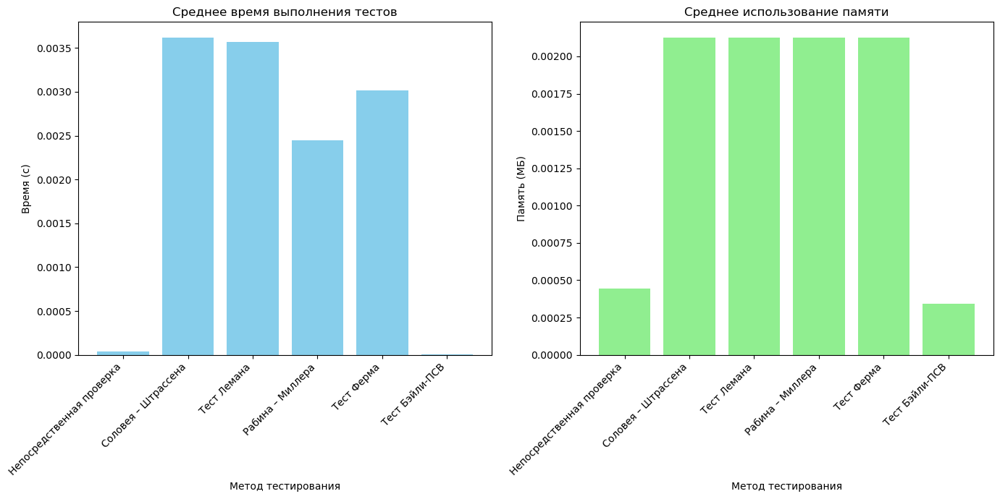

In [ ]:
import random
import math
import time
import statistics
import sys
import os
import tracemalloc
from concurrent.futures import ThreadPoolExecutor
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from tabulate import tabulate
from rich.console import Console
from rich.table import Table as RichTable
from rich.style import Style

class TestTimeoutError(Exception):
    """Пользовательское исключение для тайм-аута теста."""
    pass

def get_digit_count_from_user():
    """Запрашивает у пользователя количество цифр для генерируемого числа."""
    while True:
        try:
            user_input = input("Введите количество цифр для генерируемого числа (от 2): ").strip()
            count = int(user_input)
            if 2 <= count <= 4000:
                return count
            else:
                print("Пожалуйста, введите число от 2.")
        except ValueError:
            print("Некорректный ввод. Введите целое число.")

def get_run_count_from_user():
    """Запрашивает у пользователя количество тестов для усреднения."""
    while True:
        try:
            user_input = input("Введите количество тестов для усреднения (от 2): ").strip()
            count = int(user_input)
            if 2 <= count:
                return count
            else:
                print("Пожалуйста, введите число от 2.")
        except ValueError:
            print("Некорректный ввод. Введите целое число.")

def get_k_from_user():
    """Запрашивает у пользователя количество итераций для вероятностных тестов."""
    while True:
        try:
            user_input = input("Введите количество итераций для вероятностных тестов (от 1): ").strip()
            count = int(user_input)
            if 1 <= count:
                return count
            else:
                print("Пожалуйста, введите число от 1.")
        except ValueError:
            print("Некорректный ввод. Введите целое число.")

def get_test_mode():
    """Запрашивает режим тестирования: генерация случайных чисел или ввод конкретного числа."""
    while True:
        user_input = input("Выберите режим (1 - генерация случайных чисел, 2 - тест конкретного числа): ").strip()
        if user_input == "1":
            return "random"
        elif user_input == "2":
            return "specific"
        else:
            print("Пожалуйста, введите 1 или 2.")

def get_specific_number():
    """Запрашивает у пользователя конкретное число для тестирования."""
    while True:
        try:
            user_input = input("Введите число для тестирования: ").strip()
            number = int(user_input)
            if number > 1:
                return number
            else:
                print("Число должно быть больше 1.")
        except ValueError:
            print("Некорректный ввод. Введите целое число.")

# --- Функции генерации и тестов (без изменений) ---
def generate_large_prime_candidate(num_digits):
    """Генерирует случайное нечетное число с заданным количеством цифр."""
    if num_digits < 2: return 0
    first_digit = random.randint(1, 9)
    other_digits = "".join([str(random.randint(0, 9)) for _ in range(num_digits - 1)])
    number_str = str(first_digit) + other_digits
    n = int(number_str)
    if n % 2 == 0: n += 1
    return n

def jacobi(a, n):
    """Вычисляет символ Якоби (a/n)."""
    if n <= 0 or n % 2 == 0: return 0
    if a == 0: return 0
    if a == 1: return 1
    a = a % n
    result = 1
    while a != 0:
        while a % 2 == 0:
            a //= 2
            n_mod_8 = n % 8
            if n_mod_8 == 3 or n_mod_8 == 5: result = -result
        a, n = n, a
        if a % 4 == 3 and n % 4 == 3: result = -result
        a = a % n
    if n == 1: return result
    return 0

def is_prime_trial_division(n, timeout=5):
    """Проверка простоты методом деления с ограничением по времени."""
    start_time = time.perf_counter()
    if n <= 1: return False
    if n <= 3: return True
    if n % 2 == 0: return False
    limit = int(math.sqrt(n)) + 1
    for i in range(3, limit, 2):
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        if n % i == 0: return False
    return True

def is_prime_solovay_strassen(n, k=20, timeout=5):
    """Тест Соловея – Штрассена с ограничением по времени."""
    start_time = time.perf_counter()
    if n <= 1: return False
    if n <= 3: return True
    if n % 2 == 0: return False
    for _ in range(k):
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        a = random.randint(2, n - 2)
        x = pow(a, (n - 1) // 2, n)
        if x == 0 or x != jacobi(a, n) % n: return False
    return True

def is_prime_lehman(n, k=20, timeout=5):
    """Тест Лемана с ограничением по времени."""
    start_time = time.perf_counter()
    if n <= 1: return False
    if n <= 3: return True
    if n % 2 == 0: return False
    for _ in range(k):
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        a = random.randint(2, n - 2)
        if math.gcd(a, n) > 1: return False
        x = pow(a, (n - 1) // 2, n)
        if x != 1 and x != n - 1: return False
    return True

def is_prime_rabin_miller(n, k=20, timeout=5):
    """Тест Рабина – Миллера с ограничением по времени."""
    start_time = time.perf_counter()
    if n <= 1: return False
    if n <= 3: return True
    if n % 2 == 0: return False
    d = n - 1
    s = 0
    while d % 2 == 0: d //= 2; s += 1
    for _ in range(k):
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        a = random.randint(2, n - 2)
        x = pow(a, d, n)
        if x == 1 or x == n - 1: continue
        for __ in range(s - 1):
            x = pow(x, 2, n)
            if x == n - 1: break
        else: return False
    return True

def is_prime_fermat(n, k=20, timeout=5):
    """Тест Ферма с ограничением по времени."""
    start_time = time.perf_counter()
    if n <= 1: return False
    if n <= 3: return True
    if n % 2 == 0: return False
    for _ in range(k):
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        a = random.randint(2, n - 2)
        if pow(a, n - 1, n) != 1: return False
    return True

def is_prime_baillie_psw(n, timeout=5):
    """Тест Бэйли-ПСВ (Baillie-PSW) с ограничением по времени."""
    start_time = time.perf_counter()
    if n <= 1: return False
    if n <= 3: return True
    if n % 2 == 0: return False
    small_primes = [3, 5, 7, 11, 13, 17, 19, 23, 29, 31, 37, 41, 43, 47, 53, 59, 61, 67, 71, 73, 79, 83, 89, 97]
    for p in small_primes:
        if n == p: return True
        if n % p == 0: return False
    if not is_prime_rabin_miller(n, k=1, timeout=timeout): return False
    if time.perf_counter() - start_time > timeout: raise TestTimeoutError
    d = n + 1; s = 0
    while d % 2 == 0: d //= 2; s += 1
    a = 0
    for i in range(1, 10):
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        a = i
        if jacobi(a, n) == -1: break
    if a == 0: return True
    u, v, u2m, v2m, qm, qm2 = 1, 1, 1, 2, 1, 1
    for bit in bin(d)[2:]:
        if time.perf_counter() - start_time > timeout: raise TestTimeoutError
        qm2 = qm2 * qm % n
        if bit == '1':
            u = (u * v2m - u2m * v) % n
            v = (v * v2m - a * u2m * u2m) % n
            u2m = (u2m * v2m - qm2) % n
            v2m = (v2m * v2m - 2 * qm2) % n
            qm = qm2
        else:
            u = (u * u2m - v * v2m) % n
            v = (v * u2m - a * v2m * v2m) % n
            u2m = (u2m * u2m - 2 * qm2) % n
            v2m = (v2m * u2m - a * qm2) % n
            qm = qm2
    if u == 0 or v == 0: return True
    return False

def run_test_with_metrics(test_func, n, *args, **kwargs):
    """Запускает тест и собирает метрики производительности."""
    tracemalloc.start()
    start_time = time.perf_counter()
    try:
        result = test_func(n, *args, **kwargs)
        end_time = time.perf_counter()
        current, peak = tracemalloc.get_traced_memory()
        tracemalloc.stop()
        return {"result": result, "time": end_time - start_time, "memory": peak / (1024 * 1024), "timeout": False}
    except TestTimeoutError:
        end_time = time.perf_counter()
        current, peak = tracemalloc.get_traced_memory()
        tracemalloc.stop()
        timeout_val = kwargs.get("timeout", 5)
        return {"result": None, "time": timeout_val, "memory": peak / (1024 * 1024), "timeout": True}

def run_tests_parallel(number_to_test, test_methods, k_probabilistic, timeout):
    """Запускает тесты параллельно, корректно обрабатывая разные сигнатуры функций."""
    with ThreadPoolExecutor() as executor:
        futures = {}
        for method_name, test_func in test_methods.items():
            if method_name == "Непосредственная проверка":
                futures[method_name] = executor.submit(run_test_with_metrics, test_func, number_to_test, timeout=timeout)
            elif method_name == "Тест Бэйли-ПСВ":
                futures[method_name] = executor.submit(run_test_with_metrics, test_func, number_to_test, timeout=timeout)
            else:
                futures[method_name] = executor.submit(run_test_with_metrics, test_func, number_to_test, k_probabilistic, timeout=timeout)
        
        results = {}
        for method_name, future in futures.items():
            metrics = future.result()
            results[method_name] = metrics
            if metrics["timeout"]: result = "Превышен лимит времени"
            elif method_name == "Непосредственная проверка": result = "Простое" if metrics["result"] else "Составное"
            else: result = "Вероятно, простое" if metrics["result"] else "Составное"
            print(f"{method_name}: {result:<25} | Время: {metrics['time']:.6f} с | Память: {metrics['memory']:.4f} МБ")
        return results

def display_rich_table(table_data, num_runs, k_probabilistic):
    """Отображает красивую цветную таблицу в консоли с помощью rich."""
    console = Console()
    table = RichTable(title=f"Итоговое сравнение по {num_runs} запускам (k={k_probabilistic})", show_header=True, header_style="bold magenta")
    table.add_column("Метод", style="cyan", width=20)
    table.add_column("Среднее время (с)", justify="right", style="green")
    table.add_column("Стд. откл. (с)", justify="right", style="dim green")
    table.add_column("Средняя память (МБ)", justify="right", style="blue")
    table.add_column("Стд. откл. (МБ)", justify="right", style="dim blue")
    table.add_column("Итерации (k)", justify="center")
    table.add_column("Вероятность ошибки", justify="center", style="yellow")
    table.add_column("Успешные тесты", justify="center")

    for row in table_data:
        success_style = "bold green" if row["Успешные тесты"] == f"{num_runs}/{num_runs}" else "bold red"
        table.add_row(
            row["Метод"],
            row["Среднее время (с)"],
            row["Стд. откл. времени (с)"],
            row["Средняя память (МБ)"],
            row["Стд. откл. памяти (МБ)"],
            row["Кол-во итераций (k)"],
            row["Вероятность ошибки"],
            row["Успешные тесты"],
            style=success_style
        )
    console.print(table)

def save_table_as_image(table_data, filename="primality_test_table.png"):
    """Сохраняет таблицу как изображение с подсветкой лучших результатов."""
    headers = list(table_data[0].keys())
    rows = [[list(d.values())] for d in table_data]
    cell_text = [list(r.values()) for r in table_data]
    
    times = [float(r["Среднее время (с)"]) for r in table_data]
    memories = [float(r["Средняя память (МБ)"]) for r in table_data]
    
    time_norm = plt.Normalize(min(times), max(times))
    memory_norm = plt.Normalize(min(memories), max(memories))
    time_colors = plt.cm.RdYlGn_r(time_norm(times)) # Красный для медленных, зеленый для быстрых
    memory_colors = plt.cm.RdYlGn_r(memory_norm(memories)) # Красный для больших, зеленый для малых

    fig, ax = plt.subplots(figsize=(20, 10))
    ax.axis('tight')
    ax.axis('off')
    the_table = ax.table(cellText=cell_text, colLabels=headers, loc='center', cellLoc='center')
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(10)
    the_table.scale(1.2, 1.5)
    for (i, j), cell in the_table.get_celld().items():
        if i == 0:
            cell.set_text_props(weight='bold', color='white')
            cell.set_facecolor('#4CAF50') # Зеленый
        else:
            cell.set_text_props(ha='center', va='center')
    time_col_idx = headers.index("Среднее время (с)")
    memory_col_idx = headers.index("Средняя память (МБ)")
    
    for i in range(1, len(table_data) + 1):
        the_table.get_celld()[(i, time_col_idx)].set_facecolor(time_colors[i-1])
        the_table.get_celld()[(i, memory_col_idx)].set_facecolor(memory_colors[i-1])
    legend_time = mpatches.Patch(color=time_colors[0], label='Медленное время')
    legend_mem = mpatches.Patch(color=memory_colors[0], label='Много памяти')
    ax.legend(handles=[legend_time, legend_mem], loc='upper right', bbox_to_anchor=(1.15, 1))

    plt.savefig(filename, bbox_inches='tight', dpi=300)
    print(f"Таблица сохранена как изображение: {filename}")
    plt.close(fig)

def visualize_results(results):
    """Визуализирует результаты тестов."""
    methods = list(results.keys())
    times = [statistics.mean(results[method]["times"]) for method in methods]
    memories = [statistics.mean(results[method]["memories"]) for method in methods]
    
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.bar(methods, times, color='skyblue')
    plt.title('Среднее время выполнения тестов')
    plt.xlabel('Метод тестирования')
    plt.ylabel('Время (с)')
    plt.xticks(rotation=45, ha='right')
    
    plt.subplot(1, 2, 2)
    plt.bar(methods, memories, color='lightgreen')
    plt.title('Среднее использование памяти')
    plt.xlabel('Метод тестирования')
    plt.ylabel('Память (МБ)')
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

def save_results_to_file(results, filename="primality_test_results.txt"):
    """Сохраняет результаты в файл."""
    with open(filename, "w", encoding='utf-8') as f:
        f.write("Результаты тестов простоты чисел\n")
        f.write("=" * 80 + "\n\n")
        for method, data in results.items():
            f.write(f"Метод: {method}\n")
            f.write(f"Среднее время: {statistics.mean(data['times']):.6f} с\n")
            if len(data['times']) > 1: f.write(f"Стандартное отклонение времени: {statistics.stdev(data['times']):.6f} с\n")
            f.write(f"Среднее использование памяти: {statistics.mean(data['memories']):.6f} МБ\n")
            if len(data['memories']) > 1: f.write(f"Стандартное отклонение памяти: {statistics.stdev(data['memories']):.6f} МБ\n")
            f.write(f"Количество успешных тестов: {sum(1 for r in data['results'] if r != 'Превышен лимит времени')}/{len(data['results'])}\n")
            f.write("\n" + "-" * 40 + "\n\n")
    print(f"Результаты сохранены в файл: {filename}")

if __name__ == "__main__":
    test_mode = get_test_mode()
    if test_mode == "random": num_digits = get_digit_count_from_user()
    else: number_to_test = get_specific_number()
    num_runs = get_run_count_from_user()
    k_probabilistic = get_k_from_user()
    
    test_methods = {
        "Непосредственная проверка": is_prime_trial_division, "Соловея – Штрассена": is_prime_solovay_strassen,
        "Тест Лемана": is_prime_lehman, "Рабина – Миллера": is_prime_rabin_miller,
        "Тест Ферма": is_prime_fermat, "Тест Бэйли-ПСВ": is_prime_baillie_psw
    }
    
    aggregated_results = {method: {"times": [], "memories": [], "results": []} for method in test_methods.keys()}
    TIMEOUT_SECONDS = 5

    print("\n" + "="*80)
    if test_mode == "random": print(f"Начинаем {num_runs} тестов для чисел длиной {num_digits} цифр.")
    else: print(f"Начинаем {num_runs} тестов для числа {number_to_test}.")
    print(f"Используем {k_probabilistic} итераций для вероятностных тестов (кроме Бэйли-ПСВ).")
    print(f"Внимание: каждая проверка имеет лимит в {TIMEOUT_SECONDS} секунд.")
    print("="*80)

    for i in range(num_runs):
        print(f"\n--- Запуск {i+1}/{num_runs} ---")
        if test_mode == "random": number_to_test = generate_large_prime_candidate(num_digits)
        print(f"Тестируемое число: {number_to_test}\n")
        run_results = run_tests_parallel(number_to_test, test_methods, k_probabilistic, TIMEOUT_SECONDS)
        for method_name, metrics in run_results.items():
            aggregated_results[method_name]["times"].append(metrics["time"])
            aggregated_results[method_name]["memories"].append(metrics["memory"])
            if metrics["timeout"]: result = "Превышен лимит времени"
            elif method_name == "Непосредственная проверка": result = "Простое" if metrics["result"] else "Составное"
            else: result = "Вероятно, простое" if metrics["result"] else "Составное"
            aggregated_results[method_name]["results"].append(result)

    print("\n" + "="*80)
    print("--- Итоговое сравнение ---".format(num_runs))
    print("="*80)

    table_data = []
    for method_name, data in aggregated_results.items():
        times, memories, results = data["times"], data["memories"], data["results"]
        mean_time, stdev_time = statistics.mean(times), statistics.stdev(times) if len(times) > 1 else 0.0
        mean_memory, stdev_memory = statistics.mean(memories), statistics.stdev(memories) if len(memories) > 1 else 0.0
        k_str = "1" if method_name == "Непосредственная проверка" else str(k_probabilistic)
        if method_name == "Тест Бэйли-ПСВ": k_str = "1"
        
        if method_name == "Непосредственная проверка": error_prob_str = "0 (точный)"
        elif method_name in ["Соловея – Штрассена", "Тест Лемана", "Тест Ферма"]: error_prob_str = f"≤ (1/2)^{k_probabilistic} ≈ {1/(2**k_probabilistic):.2e}"
        elif method_name == "Рабина – Миллера": error_prob_str = f"≤ (1/4)^{k_probabilistic} ≈ {1/(4**k_probabilistic):.2e}"
        elif method_name == "Тест Бэйли-ПСВ": error_prob_str = "Очень низкая (детерминированный для <2^64)"
        else: error_prob_str = "N/A"
        
        successful_runs = sum(1 for r in results if r != "Превышен лимит времени")
        successful_runs_str = f"{successful_runs}/{num_runs}"

        table_data.append({
            "Метод": method_name, "Среднее время (с)": f"{mean_time:.6f}", "Стд. откл. времени (с)": f"{stdev_time:.6f}",
            "Средняя память (МБ)": f"{mean_memory:.4f}", "Стд. откл. памяти (МБ)": f"{stdev_memory:.4f}",
            "Кол-во итераций (k)": k_str, "Вероятность ошибки": error_prob_str, "Успешные тесты": successful_runs_str
        })

    display_rich_table(table_data, num_runs, k_probabilistic)
    
    try: visualize_results(aggregated_results)
    except Exception as e: print(f"\nНе удалось визуализировать результаты: {e}")
    
    save_option = input("\nСохранить текстовый отчет в файл? (д/н): ").strip().lower()
    if save_option in ["д", "y", "yes"]: save_results_to_file(aggregated_results)
    
    save_image_option = input("Сохранить таблицу как изображение (PNG)? (д/н): ").strip().lower()
    if save_image_option in ["д", "y", "yes"]: save_table_as_image(table_data)
    
    print("\n" + "="*80)
    print("Анализ завершен.")